# Calibrating camera

This image is: <class 'numpy.ndarray'> with dimesions: (720, 1280, 3)


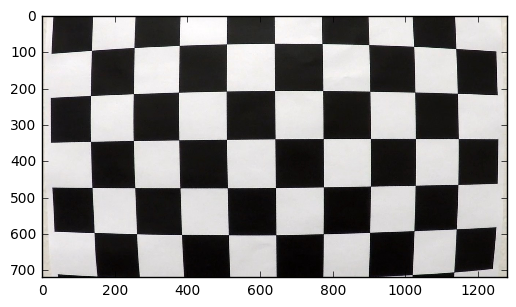

In [1]:
import pickle
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

%matplotlib inline

# Read an calibration image
fname = 'camera_cal/calibration1.jpg'
img = mpimg.imread(fname)

print('This image is:', type(img), 'with dimesions:', img.shape)
plt.imshow(img)



### Corner detection

testing on an image

True


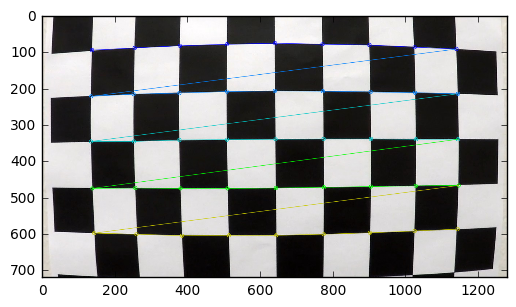

In [2]:
nx = 9#number of inside corners in x
ny = 5#number of inside corners in y

# Converting to grayscale
gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

# Finding the chessboard corners
ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
print(ret)
# If found, drawing corners
if ret == True:
    # Drawing and displaying the corners
    cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
    plt.imshow(img)



#### Corner detection on all calibration images

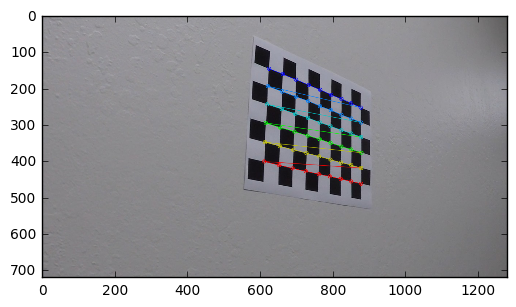

In [3]:
import glob

nx = 9 # number of inside corners in x
ny = 6 # number of inside corners in y

objpoints = []
imgpoints = []

# crating a regular grid for object points
objp = np.zeros((ny*nx,3), np.float32)
objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1,2)

# reading in multiple images used for calibration
images = glob.glob('camera_cal/calibration*.jpg')

# loop trough images
for fname in images:
    # reading in image
    img = mpimg.imread(fname)
    # Converting to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Detecting corners
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
    
    # If found, drawing corners
    if ret == True:
        # Appending corners to the image point list and appropriate regular grid to object list
        objpoints.append(objp)
        imgpoints.append(corners)
        # Drawing and displaying the corners
        cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
        plt.imshow(img)

#### Corecting for distortion

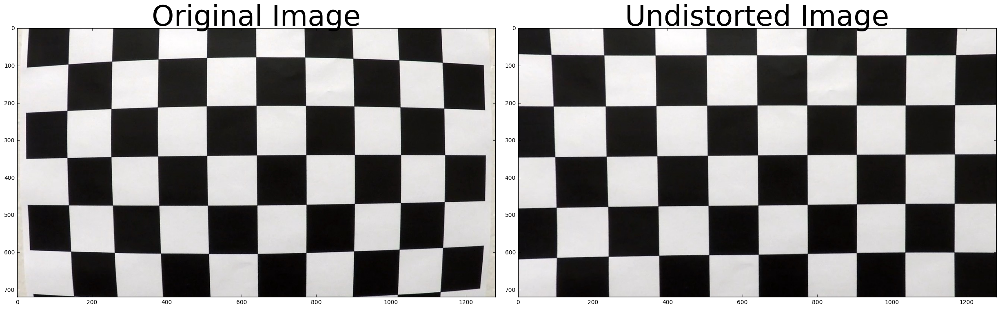

In [4]:
def cal_undistort(img, objpoints, imgpoints):
    ret, mtx, dist, rvecs, tvecs =cv2.calibrateCamera(objpoints, imgpoints, img.shape[0:2], None, None)
    undist = cv2.undistort(img, mtx, dist)
    return undist

fname = 'camera_cal/calibration1.jpg'
img = mpimg.imread(fname)

undistorted = cal_undistort(img, objpoints, imgpoints)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(undistorted)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

# Lane line detection

Loading the image

This image is: <class 'numpy.ndarray'> with dimesions: (720, 1280, 3)


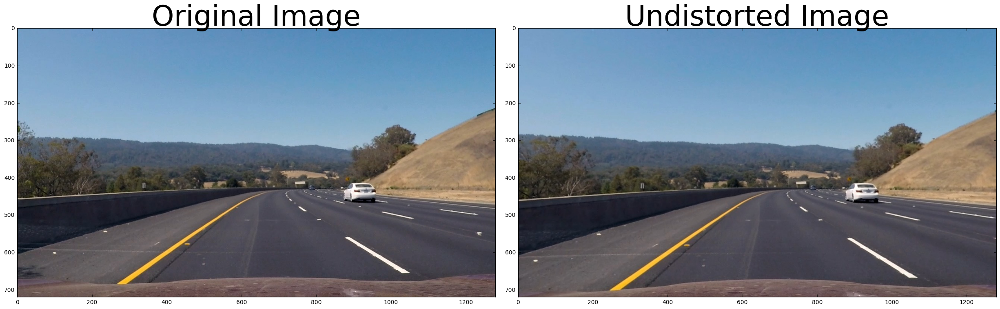

In [93]:
fname = 'test_images/test3.jpg'
img = mpimg.imread(fname)


print('This image is:', type(img), 'with dimesions:', img.shape)

undistorted = cal_undistort(img, objpoints, imgpoints)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(undistorted)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Thresholding based on direction of the gradient

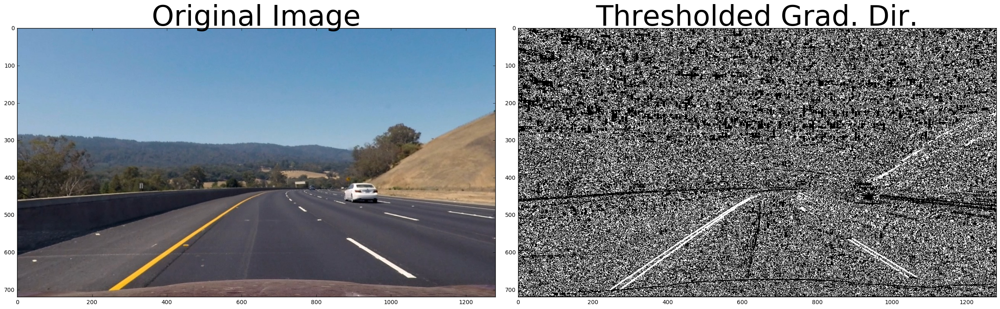

In [94]:
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    
    # Converting to grayscake
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Calculating gradients in X direction
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    abs_sobelx = np.absolute(sobelx)
    # Calculating gradients in Y direction
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
    abs_sobely = np.absolute(sobely)
    # Calculating direction of gradient
    sobeldir = np.arctan2(abs_sobely, abs_sobelx)
    # Binary thresholding
    binary_output = np.zeros_like(sobeldir)
    binary_output[(sobeldir >= thresh[0]) & (sobeldir <= thresh[1])] = 1

    return binary_output
    
# Run the function
img = undistorted
dir_binary = dir_threshold(img, sobel_kernel=15, thresh=(0.7, 1.3))
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(dir_binary, cmap='gray')
ax2.set_title('Thresholded Grad. Dir.', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Thresholding based on magnitude of the gradient

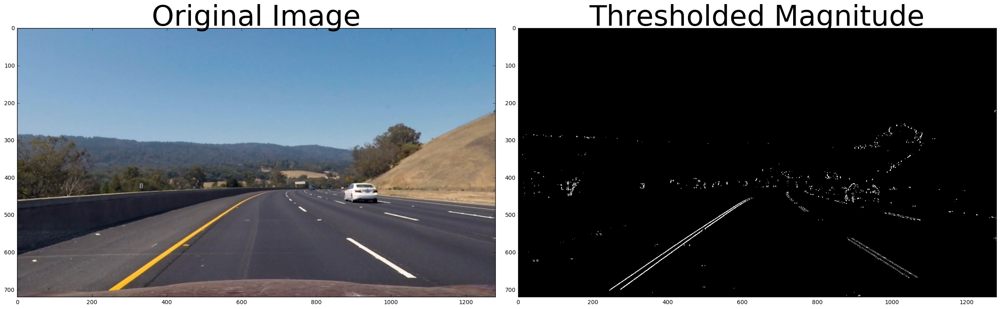

In [95]:
def mag_thresh(img, sobel_kernel=11, mag_thresh=(30, 100)):
    # Warning! Taking gradient in x direction only
    # Converting to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Calculating the gradient in X driection
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    # Calculating the gradient in Y driection
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
    # Calculating the magnitude 
    sobelmag = np.sqrt(sobelx**2+0*sobely**2)
    # Scaling to 8-bit (0 - 255) and convert to type = np.uint8
    scaled_sobel = np.uint8(255*sobelmag/np.max(sobelmag))
    # Creating a binary mask where mag thresholds are met
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= mag_thresh[0]) & (scaled_sobel <= mag_thresh[1])] = 1
    # Returning this mask as your binary_output image
    return binary_output
    
# Running the function
mag_binary = mag_thresh(img, sobel_kernel=3, mag_thresh=(50, 100))
# Plotting the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(mag_binary, cmap='gray')
ax2.set_title('Thresholded Magnitude', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Thresholding based on the color

HLS color representaion is used. Both, H and S channels are used S is usually set select to high and H to select low values.

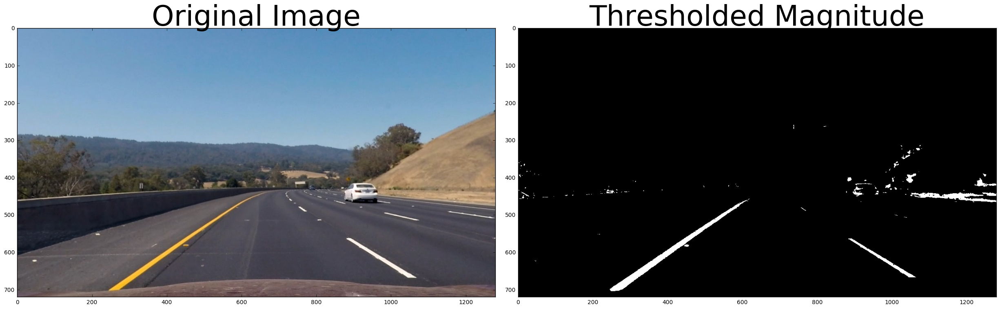

In [96]:
def col_thresh(img, threshS = (90, 255), threshH = (5, 100)):
    # Converting to HLS representation
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    # Extracting H, L and S 
    H = hls[:,:,0]
    L = hls[:,:,1]
    S = hls[:,:,2]

    threshS = (90, 255)
    threshH = (5, 100)
    # Thresholding based on Color
    binary = np.zeros_like(S)
    binary[ (S > threshS[0]) & (S <= threshS[1]) &(H > threshH[0]) & (H <= threshH[1])] = 1
    return binary


col_binary = col_thresh(img, (90, 255), (5, 100))
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(col_binary, cmap='gray')
ax2.set_title('Thresholded Magnitude', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)



## Combining color and Mag thresholding

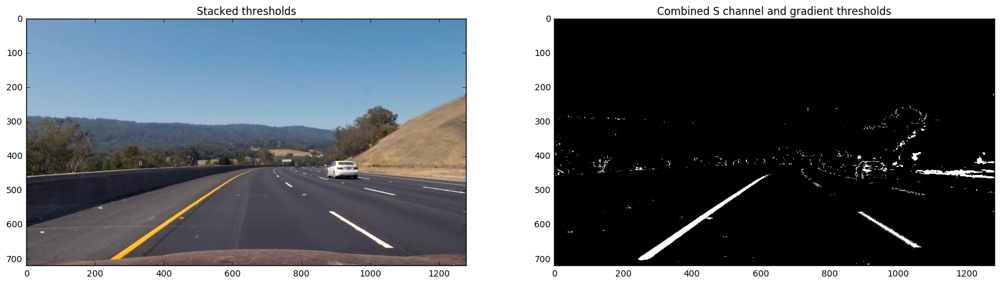

In [97]:
mag_binary = mag_thresh(img, sobel_kernel=3, mag_thresh=(50, 100))
col_binary = col_thresh(img, (90, 255), (5, 100))

combined_binary = np.zeros_like(mag_binary)
combined_binary[(col_binary == 1) | (mag_binary == 1)] = 1


# Plotting thresholded images
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.set_title('Stacked thresholds')
ax1.imshow(img)

ax2.set_title('Combined S channel and gradient thresholds')
ax2.imshow(combined_binary, cmap='gray')

### Perspective Transformation

Ploting straight image and manually detecting lanelines to define transformation coordinates

This image is: <class 'numpy.ndarray'> with dimesions: (720, 1280, 3)


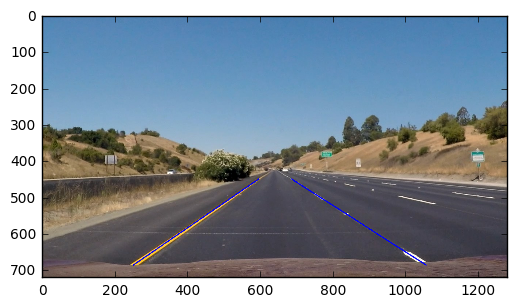

In [98]:
# Read an straight line image
fname = 'test_images/straight_lines1.jpg'
img_persp = mpimg.imread(fname)

leftbottom = (250,687)
lefttop = (595,450)
rightbottom = (1055,687)
righttop = (685,450)
img_persp_line = np.copy(img_persp) 
cv2.line(img_persp_line, leftbottom, lefttop, [0, 0, 255], 2)
cv2.line(img_persp_line, rightbottom , righttop , [0, 0, 255], 2)

print('This image is:', type(img_persp_line), 'with dimesions:', img_persp_line.shape)
plt.imshow(img_persp_line)

### Perspective Transformation to bird view

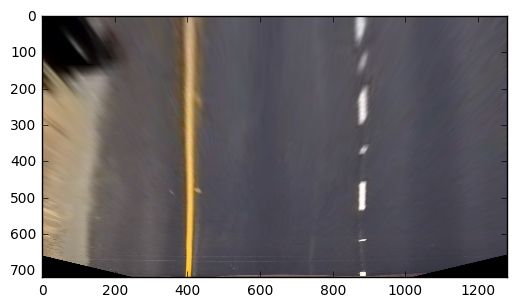

In [99]:
def birdview(img_persp):
    src = np.float32([ lefttop , leftbottom ,  righttop, rightbottom])
    dst = np.float32([[400,0],[400,720],[880,0],[880,720]])
        

    M = cv2.getPerspectiveTransform(src, dst)
            # e) use cv2.warpPerspective() to warp your image to a top-down view
    img_size = (img_persp.shape[1], img_persp.shape[0])
    
    return cv2.warpPerspective(img_persp, M, img_size, flags=cv2.INTER_LINEAR)

plt.imshow(birdview(img_persp))

### Sliding window

In [100]:

def sliding_window(binary_warped):

    # Taking a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]/2:,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    
    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    
    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
    
    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)
    
    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 
    
    # coloring Left and Right lane into Red and Blue
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    return out_img, left_fit, right_fit, leftx, lefty, rightx, righty 

# Warped binary image called "binary_warped"
binary_warped = birdview(combined_binary)
out_img, left_fit, right_fit, leftx, lefty, rightx, righty  = sliding_window(binary_warped )


# Plot histogram
#plt.plot(histogram)

#### Plotting

(720, 0)

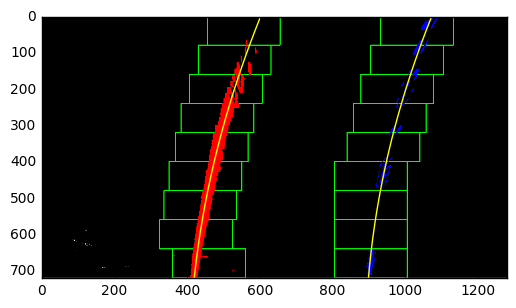

In [101]:
# Generate x and y values for plotting
ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

#plotting image from sliding_window 
plt.imshow(out_img)

#plotting fitted lane lines
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)

### Search in vicinity of lines

In [102]:
def find_lane(binary_warped, left_fit, right_fit):
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    
    #Plotting

    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]


    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result_img = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
    return result_img, left_fit, right_fit, leftx, lefty, rightx, righty
    
    
#Calling function
result_img, left_fit, right_fit, leftx, lefty, rightx, righty = find_lane(binary_warped, left_fit, right_fit)


#### Plotting

(720, 0)

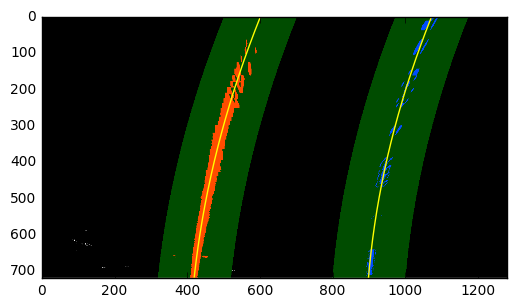

In [103]:
# Generate x and y values for plotting
ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]


plt.imshow(result_img)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)

### Radius calculation

In [104]:
def find_radius ( leftx, lefty, rightx, righty ):
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    y_eval = np.max(ploty)

    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    # Now our radius of curvature is in meters
    return left_curverad, right_curverad


#Testing
left_curverad, right_curverad = find_radius ( leftx, lefty, rightx, righty )
print('Curvature:', left_curverad, 'm', right_curverad, 'm')
# Example values: 632.1 m    626.2 m


Curvature: 809.04668505 m 750.994579312 m


### Vehicle position

In [105]:
def find_position(left_fit, right_fit):

    ploty= 720
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    position= (left_fitx + right_fitx - 1280)/2*xm_per_pix
    
    return position

# test
print('Vehicle position:', find_position(left_fit, right_fit) , 'm')


Vehicle position: 0.0993149436152 m


### Draw lane lines

In [114]:
def draw_lanes(image, left_fit, right_fit, curvature, position, out_img):  # plotting lanes
    
    ploty = np.array(np.linspace(0, image.shape[0]-1, 10 ), dtype=np.int32)
    left_fitx = np.array(left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2], dtype=np.int32)
    right_fitx = np.array(right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2], dtype=np.int32)
  

    # Create an image to draw the lines on
    #warp_zero = np.zeros_like(out_img).astype(np.uint8)
    color_warp = np.zeros_like(image).astype(np.uint8) #np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))
    
    #print (np.shape(pts))
    #print (pts)

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp,  np.int32([pts]), (0,255, 0))
    #cv2.line(image, (480, 330), (640, 330), [0, 255, 0], 1)

    src = np.float32([ lefttop , leftbottom ,  righttop, rightbottom])
    dst = np.float32([[400,0],[400,720],[880,0],[880,720]])
        

    Minv = cv2.getPerspectiveTransform(dst,src)
    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0])) 
    # Combine the result with the original image
    
    result = cv2.addWeighted(image, 1, newwarp, 0.3, 0)
    
    font = cv2.FONT_HERSHEY_SIMPLEX
    cv2.putText(result, 'Curvature radius = %d [m]' % curvature, (50, 50), font, 1, (255, 255, 255), 2)
    cv2.putText(result, 'Vehicle position = %d [cm]' % position, (50, 100), font, 1, (255, 255, 255), 2)
    
        
    cv2.putText(result, 'https://github.com/zlatanajanovic', (50, 700), font, 1, (255, 255, 255), 2)
            
        
    
    return result

## Process image

Use all functions on an image

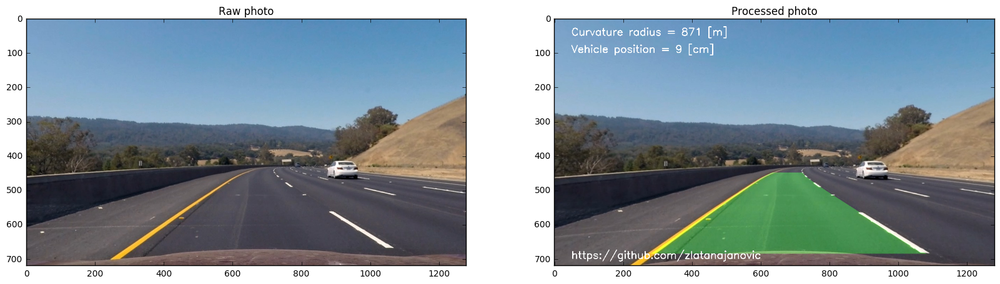

In [115]:
def process_image(image):
    # Undistort image
    image = cal_undistort(image, objpoints, imgpoints)
    # Gradient Magnitude thresholding
    mag_binary = mag_thresh(image, sobel_kernel=3, mag_thresh=(50, 100))
    # Color thresholding
    col_binary = col_thresh(image, (90, 255), (5, 100))
    # Combining
    combined_binary = np.zeros_like(col_binary)
    combined_binary[(col_binary == 1) | (mag_binary == 1)] = 1
    #Sliding window for first frame or when lane line is lost
    out_img, left_fit, right_fit, leftx, lefty, rightx, righty  = sliding_window(birdview(combined_binary))
    
    # Add processing
    # Road curvature calculation
    left_curverad, right_curverad = find_radius ( leftx, lefty, rightx, righty )
    curvature = (left_curverad + right_curverad)/2
    # Vehicle position calculation
    position = 100* find_position(left_fit, right_fit)    
    # Drawing lane lines
    result = draw_lanes(image, left_fit, right_fit, curvature, position, out_img) 
    

    return result

# Plotting thresholded images
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.set_title('Raw photo')
ax1.imshow(img)

ax2.set_title('Processed photo')
ax2.imshow(process_image(img))


# Test on video

In [108]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [109]:
white_output = 'project_marked.mp4'
clip1 = VideoFileClip("project_video.mp4")
white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(white_output, audio=False)

[MoviePy] >>>> Building video project_marked.mp4
[MoviePy] Writing video project_marked.mp4



100%|█████████████████████████████████████▉| 1260/1261 [41:15<00:01,  1.92s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_marked.mp4 

Wall time: 41min 17s


In [84]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(white_output))